#  ----------------------------   Estructuración de Redes Sociales  ----------------------

<img src="https://2.bp.blogspot.com/-uwVjNM32AGk/VuVpxEDjr3I/AAAAAAAAOSo/rQK2yPPLon8Olb2qfG0NgrXWLLdd7RLQA/s1600/Panzer_II_AusfC_AK.png" >

# Tarea 1
Developed by [Andrea Sissa](mailto:ap.sissa10@uniandes.edu.co) -- [Jesús Solano](mailto:ja.solano588@uniandes.edu.co) 
version 7.3, Septiembre 29 2018

# Punto 2 $\rightarrow$ Redes de FIFA

In [0]:
# Importar librerias necesarias para analizar redes.

import networkx as nx 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import pickle 

In [3]:
# Descargar bases de datos.

import os

path = ''

if not os.path.exists(path+'fifa2018Pro.csv'):

  ! wget https://github.com/AndreaSissa/EstructuraRedesSociales/raw/master/Taller1/Punto2/Data/fifa2018Pro.csv
  ! wget https://github.com/AndreaSissa/EstructuraRedesSociales/raw/master/Taller1/Punto2/Data/MatricesBarca5RM0.xlsx


Redirecting output to ‘wget-log’.

Redirecting output to ‘wget-log.1’.


In [26]:
# Leer los archivos que contienen los nodos y arcos de la red. 

fifa2018data = pd.read_csv(path+'fifa2018Pro.csv', sep=';',  encoding = "ISO-8859-1")

fifa2018data.head(15)

,Club,Nacionalidad,Jugadores,Promedio edad,Promedio Rating,Promedio Altura,Promedio Peso
0,1. FC Heidenheim,Australia,1,24.000000,66.000000,184.000000,77.000000
1,1. FC Heidenheim,Austria,1,21.000000,64.000000,177.000000,72.000000
2,1. FC Heidenheim,Bosnia Herzegovina,1,18.000000,54.000000,193.000000,83.000000
3,1. FC Heidenheim,Germany,19,24.578947,66.842105,184.631579,79.105263
4,1. FC Heidenheim,Netherlands,1,28.000000,67.000000,187.000000,87.000000
5,1. FC Heidenheim,Poland,1,18.000000,54.000000,185.000000,80.000000
6,1. FC Heidenheim,Romania,1,28.000000,68.000000,180.000000,77.000000
7,1. FC Köln,Denmark,1,24.000000,72.000000,194.000000,88.000000
8,1. FC Köln,France,2,24.500000,76.000000,187.000000,83.000000
9,1. FC Köln,Germany,17,24.235294,70.294118,183.470588,78.529412


In [0]:
# Consulta los nodos(clubes y nacionalidades) de la red bipartita.

clubNodes = fifa2018data['Club'].unique()
nationNodes = fifa2018data['Nacionalidad'].unique()


In [0]:
### Construccion de la red. 

fifaNetwork = nx.Graph()

# Agrega los nodos relacionados con naciones.
for nation in nationNodes:
    # Carga cada nacion y lo agrega a la red.
    fifaNetwork.add_node(nation,bipartite=0)

# Agrega los nodos relacionados con clubes.
for club in clubNodes:

    # Carga cada club y lo agrega a la red.
    fifaNetwork.add_node(club,bipartite=1)

  
  
# Itearcion para crear los arcos entre paises y clubes.

for e in range(len(fifa2018data)):

    # Busca los nodos conectados. 

    sourceNode = fifa2018data['Nacionalidad'][e]
    targetNode = fifa2018data['Club'][e]

    # Crea el arco y le añade atributos.
    fifaNetwork.add_edge(sourceNode,targetNode,jugadores=fifa2018data['Jugadores'][e],edad =fifa2018data['Promedio edad'][e] , rating= fifa2018data['Promedio Rating'][e] , altura=fifa2018data['Promedio Altura'][e] , peso=fifa2018data['Promedio Peso'][e])




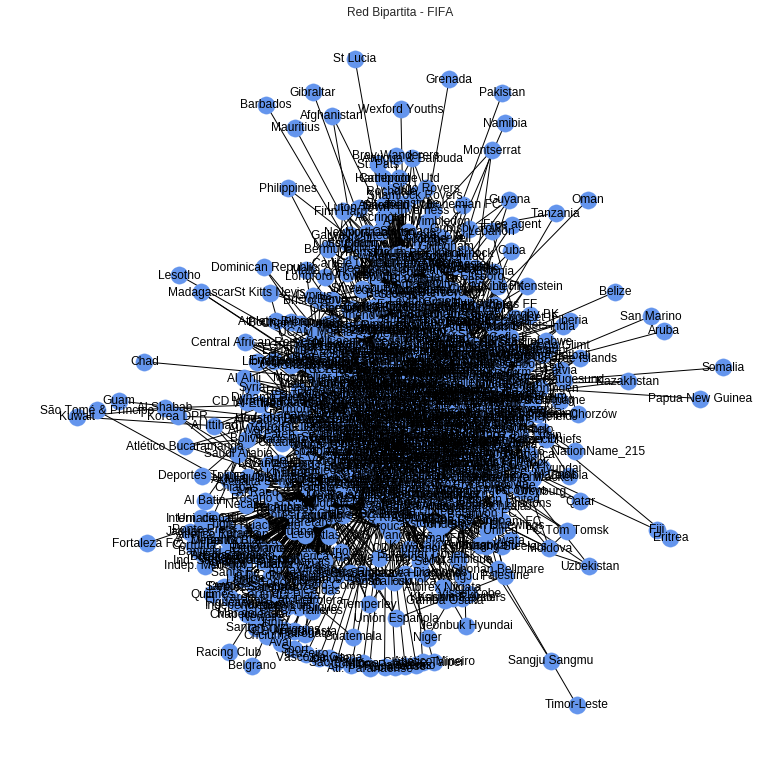

Dado que el algoritmo basico no dibuja correctamente la red bipartita, es necesario crear una funcion para hacerlo. --->


In [31]:
# Graficar la red fifa inducida. 

plt.figure(figsize=(10,10))
nx.draw(fifaNetwork, with_labels=True, node_color='cornflowerblue')
plt.title('Red Bipartita - FIFA')
plt.show()

print('Dado que el algoritmo basico no dibuja correctamente la red bipartita, es necesario crear una funcion para hacerlo. --->')

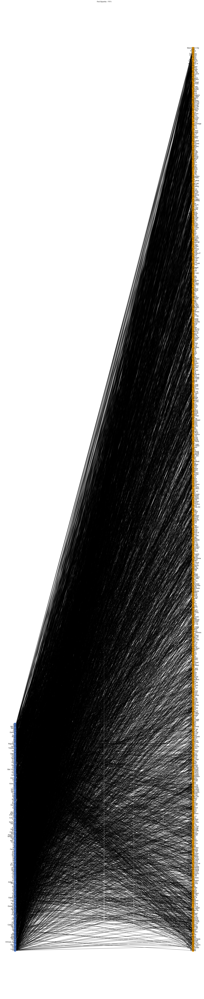

In [7]:
# Funcion para graficar una red bipartita a partir de los arcos de la misma.

def drawBipartite(bipartiteNetwork):
    
    # Leemos los conjuntos de la red bipartita. 
    nations,clubes = nx.bipartite.sets(bipartiteNetwork)
    
    # Cambiamos de color segun el tipo.
    nodecolor = []
    for node in bipartiteNetwork.nodes():
        a = 'cornflowerblue' if node in list(nations) else 'orange'
        nodecolor.append(a)
    
    # Asignamos posiciones en el grafico.
    pos = {}
   
    pos.update((node, (1, index*2)) for index, node in enumerate(nations))
    pos.update((node, (2, index*2)) for index, node in enumerate(clubes))
  
    # Graficamos la red.
    plt.figure(figsize=(20,100))
    nx.draw(bipartiteNetwork, pos=pos,with_labels = True,node_color=nodecolor)
    plt.title('Red Bipartita - FIFA')
    plt.show()
    
# Usamos nuestra funcion para dibujar la red. 

drawBipartite(fifaNetwork)

¿Cuáles son las 10 nacionalidades más contratadas por los clubes?

In [32]:
# Leemos los conjuntos de la red bipartita. 
nations,clubes = nx.bipartite.sets(fifaNetwork)

# Calculamos el degree de cada nacionalidad.

nationsDegree = dict(fifaNetwork.degree(nations))

topTenNations =  sorted(nationsDegree,key=nationsDegree.get,reverse=True)[:10]


# Imprimimos los resultados de las 10 naciones mas contratadas.

print('Las diez naciones mas contratadas por los clubes son:\n ')
count=1
for i in topTenNations:
  print(' ',count,'. ', i)
  count+=1

Las diez naciones mas contratadas por los clubes son:
 
  1 .  Brazil
  2 .  France
  3 .  Argentina
  4 .  Spain
  5 .  England
  6 .  Portugal
  7 .  Uruguay
  8 .  Republic of Ireland
  9 .  Serbia
  10 .  Ghana


¿Cuántos jugadores son contratados para cada nacionalidad del inciso a?

In [9]:
###  Calculamos el degree de cada nacionalidad(pero con el numero de jugadores) y traemos los valores de las 10 mas contratadas.

# Suma sobre los arcos de una nacion para hallar el numero total de jugadores contratados. 
nationsDegreeJugadores = dict(fifaNetwork.degree(nations,weight='jugadores'))

# Imprime el numero de jugadores contratados.
for nation in topTenNations:
  print(nation,' : ',nationsDegreeJugadores[nation])

Brazil  :  921
France  :  974
Argentina  :  1097
Spain  :  1008
England  :  1618
Portugal  :  360
Uruguay  :  153
Republic of Ireland  :  442
Serbia  :  136
Ghana  :  119


¿Cuál es la estatura y el peso de los jugadores contratados para cada nacionalidad del inciso a?

In [10]:
###  Calculamos el degree de cada nacionalidad(pero con el peso de jugadores) y traemos los valores de las 10 mas contratadas.

nationsDegreeEstatura = dict(fifaNetwork.degree(nations,weight='altura'))

nationsDegreePeso = dict(fifaNetwork.degree(nations,weight='peso'))


# Imprime el numero de jugadores contratados.
for nation in topTenNations:
  print(nation,' : \n   Peso Promedio =  ',nationsDegreePeso[nation]/nationsDegree[nation],'\n    Altura Promedio = ', nationsDegreeEstatura[nation]/nationsDegree[nation])

Brazil  : 
   Peso Promedio =   76.24888478379857 
    Altura Promedio =  181.0088792792456
France  : 
   Peso Promedio =   76.41835713461712 
    Altura Promedio =  182.38717866958862
Argentina  : 
   Peso Promedio =   75.977213394775 
    Altura Promedio =  180.004987867339
Spain  : 
   Peso Promedio =   74.37891133506396 
    Altura Promedio =  180.5599531272976
England  : 
   Peso Promedio =   75.24215689743087 
    Altura Promedio =  181.58516890197825
Portugal  : 
   Peso Promedio =   74.71628728191386 
    Altura Promedio =  180.45646892749193
Uruguay  : 
   Peso Promedio =   75.0685534591195 
    Altura Promedio =  180.18003144654088
Republic of Ireland  : 
   Peso Promedio =   75.74314100565682 
    Altura Promedio =  181.83380989189237
Serbia  : 
   Peso Promedio =   78.86764705882354 
    Altura Promedio =  185.05555555555557
Ghana  : 
   Peso Promedio =   72.52227722772277 
    Altura Promedio =  178.17821782178217


¿Cuáles son los clubes que más contratan a esas 10 nacionalidades del inciso a?

In [58]:
# Recorre las 10 nacionalidades mas contratas y devuelve el club que mas jugadores tiene.

for nation in topTenNations:
  print('\nLos clubes que mas contratan a ', nation,' son: \n')
  # Calcula a cada club el numero de jugadores contratados.
  numJugadores = {}
  for club in fifaNetwork.neighbors(nation):
    numJugadores[club] = fifaNetwork[nation][club]['jugadores']
  
  # Encuentra los 5 clubes que mas contratan la nacionalidad.
  topFiveClubes = sorted(numJugadores,key=numJugadores.get,reverse=True)[:5]
  
  # Imprime los clubes que mas contratan:
  counter = 1
  for club in topFiveClubes:
    print('  ', counter, '. ', club, ' con ', numJugadores[club], ' jugadores.' )


Los clubes que mas contratan a  Brazil  son: 

   1 .  A. Minas G.  con  20  jugadores.
   1 .  Atl. Paranaense  con  20  jugadores.
   1 .  Atlético Mineiro  con  20  jugadores.
   1 .  Avaí  con  20  jugadores.
   1 .  Botafogo  con  20  jugadores.

Los clubes que mas contratan a  France  son: 

   1 .  EA Guingamp  con  23  jugadores.
   1 .  OGC Nice  con  23  jugadores.
   1 .  AJ Auxerre  con  22  jugadores.
   1 .  Bourg-Péronnas  con  22  jugadores.
   1 .  Olym. Lyonnais  con  22  jugadores.

Los clubes que mas contratan a  Argentina  son: 

   1 .  Belgrano  con  30  jugadores.
   1 .  Racing Club  con  30  jugadores.
   1 .  Fl. Varela  con  29  jugadores.
   1 .  Quilmes  con  29  jugadores.
   1 .  Banfield  con  28  jugadores.

Los clubes que mas contratan a  Spain  son: 

   1 .  Athletic Bilbao  con  27  jugadores.
   1 .  CA Osasuna  con  26  jugadores.
   1 .  CD Mirandés  con  26  jugadores.
   1 .  Levante UD  con  26  jugadores.
   1 .  Real Oviedo  con  26  jugad

¿Cuáles son los clubes que contratan a los mejores jugadores?

In [11]:
# Leemos los conjuntos de la red bipartita. 
nations,clubes = nx.bipartite.sets(fifaNetwork)

# Calculamos el degree de cada nacionalidad.

clubesDegree = dict(fifaNetwork.degree(clubes))
clubesDegreeRating = dict(fifaNetwork.degree(clubes, weight='rating'))

# Encuentra el promedio ponderado del rating para cada club.
bestClubes={}
for club in clubesDegree:
  bestClubes[club] = clubesDegreeRating[club]/clubesDegree[club]


topTenClubes =  sorted(bestClubes,key=bestClubes.get,reverse=True)[:10]


# Imprimimos los resultados de las 10 naciones mas contratadas.

print('Los diez clubes que contratan a los mejores jugadores son:\n ')
count=1
for i in topTenClubes:
  print(' ',count,'. ', i)
  count+=1

Los diez clubes que contratan a los mejores jugadores son:
 
  1 .  FC Bayern
  2 .  Juventus
  3 .  Free agent
  4 .  FC Barcelona
  5 .  PSG
  6 .  Athletic Bilbao
  7 .  Sevilla FC
  8 .  Napoli
  9 .  Real Madrid
  10 .  Arsenal


¿De cuáles nacionalidades son los mejores jugadores?

In [12]:
# Leemos los conjuntos de la red bipartita. 
nations,clubes = nx.bipartite.sets(fifaNetwork)

# Calculamos el degree de cada nacionalidad.

nationsDegree = dict(fifaNetwork.degree(nations))
nationsDegreeRating = dict(fifaNetwork.degree(nations, weight='rating'))

# Encuentra el promedio ponderado del rating para cada nacionalidad.
bestNations={}
for nation in nationsDegree:
  bestNations[nation] = nationsDegreeRating[nation]/nationsDegree[nation]
  
topTenNations =  sorted(bestNations,key=bestNations.get,reverse=True)[:10]


# Imprimimos los resultados de las 10 naciones mas contratadas.

print('Las nacionalidades que tienen EN PROMEDIO a los mejores jugadores son:\n ')
count=1
for i in topTenNations:
  print(' ',count,'. ', i)
  count+=1

Las nacionalidades que tienen EN PROMEDIO a los mejores jugadores son:
 
  1 .  Chad
  2 .  São Tomé & Príncipe
  3 .  Dominican Republic
  4 .  Cuba
  5 .  Algeria
  6 .  Ecuador
  7 .  Portugal
  8 .  Argentina
  9 .  Togo
  10 .  Eritrea


In [13]:
# Ahora bien, si queremos saber la nacionalidad de los mejores jugadores individualmente.

#sorted(fifa2018data['Promedio Rating'],reverse=True)

fifa2018data.sort_values('Promedio Rating',ascending=False)[:10]

,Club,Nacionalidad,Jugadores,Promedio edad,Promedio Rating,Promedio Altura,Promedio Peso
3573,Real Madrid,Wales,1,27.0,90.0,183.0,74.0
2744,Manchester Utd,Sweden,1,35.0,90.0,195.0,95.0
1476,FC Bayern,Poland,1,28.0,90.0,185.0,79.0
1444,FC Barcelona,Argentina,2,30.5,88.5,172.0,72.5
336,Arsenal,Chile,1,28.0,88.0,169.0,62.0
338,Arsenal,Czech Republic,1,34.0,88.0,196.0,90.0
3567,Real Madrid,Germany,1,27.0,88.0,182.0,78.0
2306,Juventus,Argentina,2,26.0,87.5,180.5,83.0
1472,FC Bayern,Chile,1,29.0,87.0,180.0,75.0
1475,FC Bayern,Netherlands,1,33.0,87.0,180.0,80.0


Analicen los resultados de los incisos anteriores y concluyan al respecto de las características de los procesos de contratación de los clubes de la FIFA durante el 2018. 

In [0]:
#### TO DO !!!!!!!!!!!!!!!

# Redes de Pases en la liga Española

## Real Madrid 

In [10]:
# Leer los archivos que contienen los nodos y arcos de la red. 

rmPassdata = pd.read_excel(path+'MatricesBarca5RM0.xlsx',sheet_name=1,usecols ='B:P')

rmPassdata.head(15)

,Iker,Sergio Ramos,Pepe,Carvalho,Marcelo,Khedira,Mesut,Xabi,Di María,Karim,C. Ronaldo,Lassana,Arbeloa,Gol
Iker,0,0,1,3,1,0,1,1,1,3,3,0,0,0
Sergio Ramos,1,0,8,1,0,6,1,5,5,1,3,1,0,0
Pepe,4,5,0,3,3,3,0,4,3,0,1,1,0,0
Carvalho,4,2,4,0,4,1,1,0,2,0,3,1,3,0
Marcelo,1,1,2,0,0,0,0,6,5,4,1,1,0,0
Khedira,1,3,1,2,0,0,0,4,1,2,1,0,0,0
Mesut,0,1,0,0,2,0,0,1,3,0,4,0,0,0
Xabi,1,2,7,7,3,0,5,0,2,3,4,0,2,0
Di María,0,2,0,1,1,2,2,1,0,1,4,0,0,0
Karim,0,0,0,0,4,2,2,2,0,0,7,1,1,0


In [11]:
# Crea el dataframe de pases en el realMadrid.

realmadridPassData = rmPassdata.drop('Gol').drop('Gol',axis=1)
realmadridPassData

,Iker,Sergio Ramos,Pepe,Carvalho,Marcelo,Khedira,Mesut,Xabi,Di María,Karim,C. Ronaldo,Lassana,Arbeloa
Iker,0,0,1,3,1,0,1,1,1,3,3,0,0
Sergio Ramos,1,0,8,1,0,6,1,5,5,1,3,1,0
Pepe,4,5,0,3,3,3,0,4,3,0,1,1,0
Carvalho,4,2,4,0,4,1,1,0,2,0,3,1,3
Marcelo,1,1,2,0,0,0,0,6,5,4,1,1,0
Khedira,1,3,1,2,0,0,0,4,1,2,1,0,0
Mesut,0,1,0,0,2,0,0,1,3,0,4,0,0
Xabi,1,2,7,7,3,0,5,0,2,3,4,0,2
Di María,0,2,0,1,1,2,2,1,0,1,4,0,0
Karim,0,0,0,0,4,2,2,2,0,0,7,1,1


In [12]:
# Crea la red dirigida de los pases.

realNetwork = nx.from_pandas_adjacency(realmadridPassData, create_using= nx.DiGraph())
print(nx.info(realNetwork))

Name: 
Type: DiGraph
Number of nodes: 13
Number of edges: 101
Average in degree:   7.7692
Average out degree:   7.7692


In [20]:
# Encontramos el podio de jugadores que mas genera futbol(hacen mayor cantidad de pases)

playerPasses = dict(realNetwork.out_degree(weight='weight'))

topThreePass =  sorted(playerPasses,key=playerPasses.get,reverse=True)[:3]


# Imprimimos los resultados de las 3 jugadores con mas pases.

print('Las jugadores que mas hacen pases en el Real Madrid son:\n ')
count=1
for i in topThreePass:
  print(' ',count,'. ', i, ' con ',playerPasses[i],' pases.')
  count+=1

Las jugadores que mas hacen pases en el Real Madrid son:
 
  1 .  Xabi  con  36  pases.
  2 .  Sergio Ramos  con  32  pases.
  3 .  Pepe  con  27  pases.


In [22]:
# Encontramos el podio de jugadores que mas reciben la pelota(reciben mayor cantidad de pases)

playerPasses = dict(realNetwork.in_degree(weight='weight'))

topThreePass =  sorted(playerPasses,key=playerPasses.get,reverse=True)[:3]


# Imprimimos los resultados de las 3 jugadores con mas pases.

print('Las jugadores que mas reciben pases en el Real Madrid son:\n ')
count=1
for i in topThreePass:
  print(' ',count,'. ', i, ' con ',playerPasses[i],' pases.')
  count+=1

Las jugadores que mas reciben pases en el Real Madrid son:
 
  1 .  C. Ronaldo  con  35  pases.
  2 .  Xabi  con  30  pases.
  3 .  Di María  con  26  pases.


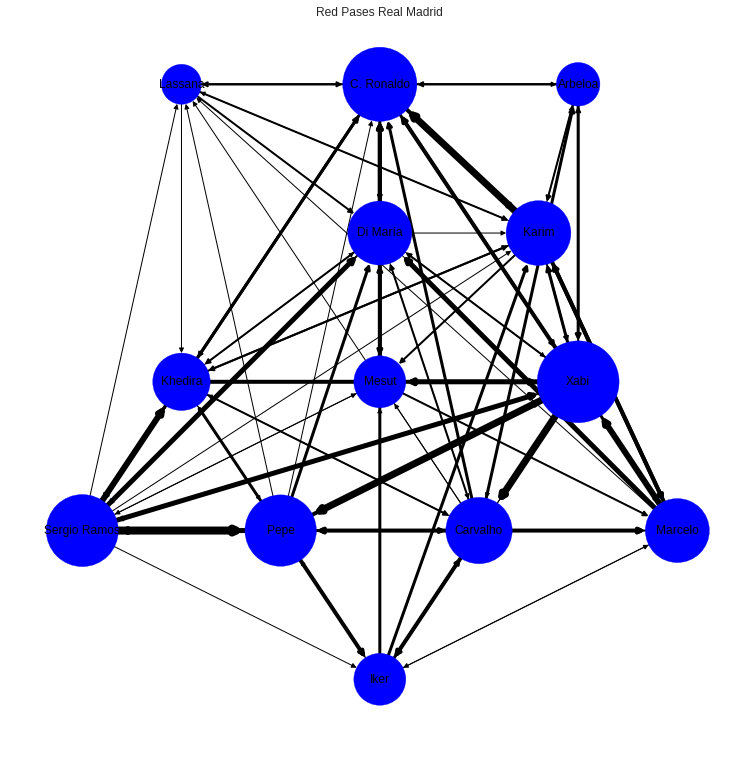

In [21]:
#### Grafica la red de jugadores.

# Posiciones especificas de los jugadores. 
pos = {'Iker': (3, 0),
       'Sergio Ramos': (1.5, 1),
       'Pepe': (2.5, 1),
       'Carvalho': (3.5, 1),
       'Marcelo': (4.5, 1),
       'Khedira': (2, 2),
       'Mesut': (3, 2),
       'Xabi': (4, 2),
       'Di María': (3, 3),
       'Karim': (3.8, 3),
       'C. Ronaldo': (3, 4),
       'Lassana': (2, 4),
       'Arbeloa': (4, 4)
       }



deg = nx.degree(realNetwork,weight ='weight')
plt.figure(figsize=(10,10))
nx.draw(realNetwork, pos, with_labels = True, node_color='b', width=list(nx.get_edge_attributes(realNetwork,'weight').values()), node_size=[(deg[node]+1) * 100 for node in realNetwork.nodes()])
plt.title('Red Pases Real Madrid')

plt.show()

## Barcelona

In [23]:
# Leer los archivos que contienen los nodos y arcos de la red. 

bPassdata = pd.read_excel(path+'MatricesBarca5RM0.xlsx',sheet_name=0,usecols ='B:Q')

bPassdata.head(15)

,Valdés,Alves,Carles Puyol,Piqué,Eric Abidal,Xavi Hernandez,Sergio Busquets,A. Iniesta,Pedro,Messi,Villa,Keita,Jeffrén,Bojan,Gol
Valdés,0,0,2,10,2,1,1,0,1,0,0,0,0,0,0
Alves,2,0,2,3,0,17,7,8,8,10,0,1,0,0,0
Carles Puyol,4,3,0,14,4,4,9,3,0,2,0,0,0,1,0
Piqué,4,2,6,0,10,13,11,9,2,4,2,0,0,1,0
Eric Abidal,3,1,1,8,0,4,12,12,0,4,8,0,1,2,0
Xavi Herandez,0,21,7,8,3,0,20,20,15,14,6,0,0,0,1
Sergio Busquets,1,7,5,15,5,24,0,11,4,11,1,0,0,0,0
A. Iniesta,1,3,3,2,13,13,10,0,7,8,10,0,1,1,0
Pedro,0,8,0,0,0,11,5,3,0,5,0,0,0,3,1
Messi,0,10,1,1,1,18,10,4,4,0,5,0,0,0,0


In [24]:
# Crea el dataframe de pases en el realMadrid.

barcelonaPassData = bPassdata.drop('Gol').drop('Gol',axis=1)
barcelonaPassData = barcelonaPassData.rename(index={'Xavi Herandez':'Xavi Hernandez'})
barcelonaPassData

,Valdés,Alves,Carles Puyol,Piqué,Eric Abidal,Xavi Hernandez,Sergio Busquets,A. Iniesta,Pedro,Messi,Villa,Keita,Jeffrén,Bojan
Valdés,0,0,2,10,2,1,1,0,1,0,0,0,0,0
Alves,2,0,2,3,0,17,7,8,8,10,0,1,0,0
Carles Puyol,4,3,0,14,4,4,9,3,0,2,0,0,0,1
Piqué,4,2,6,0,10,13,11,9,2,4,2,0,0,1
Eric Abidal,3,1,1,8,0,4,12,12,0,4,8,0,1,2
Xavi Hernandez,0,21,7,8,3,0,20,20,15,14,6,0,0,0
Sergio Busquets,1,7,5,15,5,24,0,11,4,11,1,0,0,0
A. Iniesta,1,3,3,2,13,13,10,0,7,8,10,0,1,1
Pedro,0,8,0,0,0,11,5,3,0,5,0,0,0,3
Messi,0,10,1,1,1,18,10,4,4,0,5,0,0,0


In [25]:
# Crea la red dirigida de los pases.

barcelonaNetwork = nx.from_pandas_adjacency(barcelonaPassData, create_using= nx.DiGraph())
print(nx.info(barcelonaNetwork))

Name: 
Type: DiGraph
Number of nodes: 14
Number of edges: 106
Average in degree:   7.5714
Average out degree:   7.5714


In [26]:
# Encontramos el podio de jugadores que mas genera futbol(hacen mayor cantidad de pases)

playerPasses = dict(barcelonaNetwork.out_degree(weight='weight'))

topThreePass =  sorted(playerPasses,key=playerPasses.get,reverse=True)[:3]


# Imprimimos los resultados de las 3 jugadores con mas pases.

print('Las jugadores que mas hacen pases en el Barcelona son:\n ')
count=1
for i in topThreePass:
  print(' ',count,'. ', i, ' con ',playerPasses[i],' pases.')
  count+=1

Las jugadores que mas hacen pases en el Barcelona son:
 
  1 .  Xavi Hernandez  con  114  pases.
  2 .  Sergio Busquets  con  84  pases.
  3 .  A. Iniesta  con  72  pases.


In [30]:
# Encontramos el podio de jugadores que mas reciben la pelota(reciben mayor cantidad de pases)

playerPasses = dict(barcelonaNetwork.in_degree(weight='weight'))

topThreePass =  sorted(playerPasses,key=playerPasses.get,reverse=True)[:3]


# Imprimimos los resultados de las 3 jugadores con mas pases.

print('Las jugadores que mas reciben pases en el Barcelona son:\n ')
count=1
for i in topThreePass:
  print(' ',count,'. ', i, ' con ',playerPasses[i],' pases.')
  count+=1

Las jugadores que mas reciben pases en el Barcelona son:
 
  1 .  Xavi Hernandez  con  110  pases.
  2 .  Sergio Busquets  con  85  pases.
  3 .  A. Iniesta  con  77  pases.


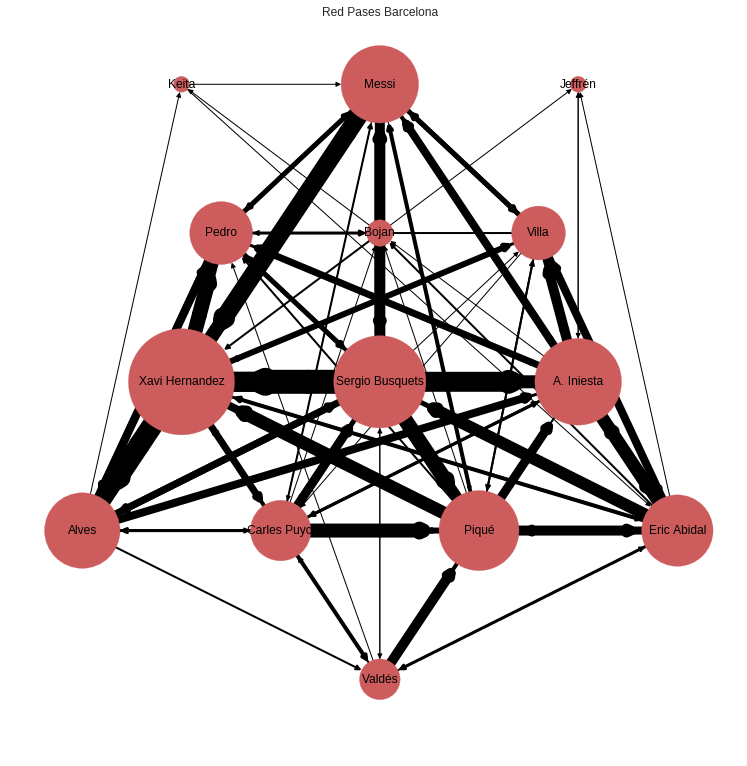

In [22]:
#### Graficamos la red de jugadores.

# Posiciones especificas de los jugadores. 
pos = {'Valdés': (3, 0),
       'Alves': (1.5, 1),
       'Carles Puyol': (2.5, 1),
       'Piqué': (3.5, 1),
       'Eric Abidal': (4.5, 1),
       'Xavi Hernandez': (2, 2),
       'Sergio Busquets': (3, 2),
       'A. Iniesta': (4, 2),
       'Pedro': (2.2, 3),
       'Bojan' : (3,3),
       'Villa': (3.8, 3),
       'Messi': (3, 4),
       'Keita': (2, 4),
       'Jeffrén': (4, 4)
       }



deg = nx.degree(barcelonaNetwork,weight ='weight')
plt.figure(figsize=(10,10))
nx.draw(barcelonaNetwork, pos, with_labels = True, node_color='indianred', width=list(nx.get_edge_attributes(barcelonaNetwork,'weight').values()), node_size=[(deg[node]+1) * 50 for node in barcelonaNetwork.nodes()])
plt.title('Red Pases Barcelona')

plt.show()

In [8]:
### Linea necesaria por si se ocasiona el error. "Install xlrd >= 0.9.0 for Excel support"

! pip3 install xlrd

    100% |████████████████████████████████| 112kB 3.0MB/s 
